# Case 1: Ligações para o 911

Para este projeto estaremos analisando alguns dados de chamadas para o 911 do [Kaggle](https://www.kaggle.com/mchirico/montcoalert). Os dados contém os seguintes campos:

* `lat`: Variável String, Latitude
* `lng`: Variável String, Longitude
* `desc`: Variável String, Descrição da Chamada de Emergência
* `zip`: Variável String, CEP
* `title`: Variável String, Título
* `timeStamp`: Variável String, AAAA-MM-DD HH: MM:SS
* `twp`: Variável String, Township
* `addr`: Variável String, Endereço
* `e`: Variável String, variável Dummy (sempre 1)

Simplesmente acompanhe este notebook e tente completar as instruções ou responder as perguntas em negrito usando suas habilidades Python e Data Science!

> [Clique aqui](https://s3-sa-east-1.amazonaws.com/lcpi/7a9cfedf-d065-4a1b-8e71-50bd68c69ad2.csv) para fazer o download do dataset.

## Dados e Configuração

**Importar numpy e pandas**

In [1]:
import numpy as np
import pandas as pd

**Importe as bibliotecas de visualização gráfica.**

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

**Leia o arquivo csv como um dataframe chamado df**

In [3]:
df=pd.read_csv('../Datasets/911.csv')

**Verifique a info() do df**

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99492 entries, 0 to 99491
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   lat        99492 non-null  float64
 1   lng        99492 non-null  float64
 2   desc       99492 non-null  object 
 3   zip        86637 non-null  float64
 4   title      99492 non-null  object 
 5   timeStamp  99492 non-null  object 
 6   twp        99449 non-null  object 
 7   addr       98973 non-null  object 
 8   e          99492 non-null  int64  
dtypes: float64(3), int64(1), object(5)
memory usage: 6.8+ MB


**Verifique o cabeçalho do df**

In [5]:
df.head(3)

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:40:00,NEW HANOVER,REINDEER CT & DEAD END,1
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:40:00,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 17:40:00,NORRISTOWN,HAWS AVE,1


## Perguntas básicas

**Quais são os top 5 CEPs nas chamadas 911?**

In [6]:
df['zip'].value_counts().head()

19401.0    6979
19464.0    6643
19403.0    4854
19446.0    4748
19406.0    3174
Name: zip, dtype: int64

In [7]:
df.groupby('zip').count()['e'].sort_values(ascending=False).head(5)

zip
19401.0    6979
19464.0    6643
19403.0    4854
19446.0    4748
19406.0    3174
Name: e, dtype: int64

**Quais são os 5 principais municípios nas chamadas 911?**

In [8]:
df.groupby('twp').count()['e'].sort_values(ascending=False).head(5)

twp
LOWER MERION    8443
ABINGTON        5977
NORRISTOWN      5890
UPPER MERION    5227
CHELTENHAM      4575
Name: e, dtype: int64

In [9]:
df['twp'].value_counts().head()

LOWER MERION    8443
ABINGTON        5977
NORRISTOWN      5890
UPPER MERION    5227
CHELTENHAM      4575
Name: twp, dtype: int64

**Dê uma olhada na coluna 'title'. Quantos códigos de título exclusivos existem?**

In [10]:
df.drop_duplicates('title').count()['title']

110

In [11]:
len(df['title'].unique())

110

In [12]:
(df['title'].nunique())

110

In [13]:
df['title'].unique().size

110

In [14]:
df['title'].unique().shape[0]

110

## Criando novos recursos

**Na coluna "title" existem "Razões / Departamentos" especificados antes do código do título. Estes são "EMS", "Fire" e "Traffic". Use .apply () com uma expressão lambda personalizada para criar uma nova coluna chamada "Razão" que contém esse valor de string.**

**Por exemplo, se o valor da coluna do título for EMS: BACK PAINS / BLESSOR, o valor da coluna Reason seria EMS.**

In [15]:
df['razão'] = df["title"].apply(lambda x: x.split(':')[0])


**Qual é o motivo mais comum para uma chamada do 911 com base nessa nova coluna?**

In [16]:
df['razão'].value_counts()

EMS        48877
Traffic    35695
Fire       14920
Name: razão, dtype: int64

In [17]:
df.groupby('razão').count()['e']

razão
EMS        48877
Fire       14920
Traffic    35695
Name: e, dtype: int64

**Agora use Seaborn para criar um countplot de chamadas 911 baseadas nesta nova coluna.**

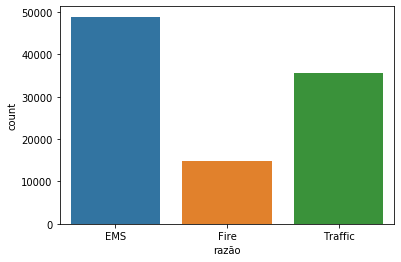

In [18]:
sns.countplot(data=df,x='razão')

In [19]:
df.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,razão
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:40:00,NEW HANOVER,REINDEER CT & DEAD END,1,EMS
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:40:00,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1,EMS
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 17:40:00,NORRISTOWN,HAWS AVE,1,Fire
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 17:40:01,NORRISTOWN,AIRY ST & SWEDE ST,1,EMS
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 17:40:01,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1,EMS


In [20]:
df['Data'] = df["timeStamp"].apply(lambda x: x.split(' ')[0])
df['Date'] = df["Data"].apply(lambda x: pd.to_datetime(x))

In [22]:
from datetime import date
df['Data2'] = df["timeStamp"].apply(lambda x: pd.to_datetime(x))
df['ano_mes'] = df['Data2'].dt.strftime('%Y''/''%m')
df['Hora'] = df['Data2'].dt.strftime('%H')
DIAS = [
    'Segunda-feira',
    'Terça-feira',
    'Quarta-feira',
    'Quinta-Feira',
    'Sexta-feira',
    'Sábado',
    'Domingo'
]
df['Dia Semana']=df['Data2'].apply(lambda x: DIAS[date.weekday(x)])


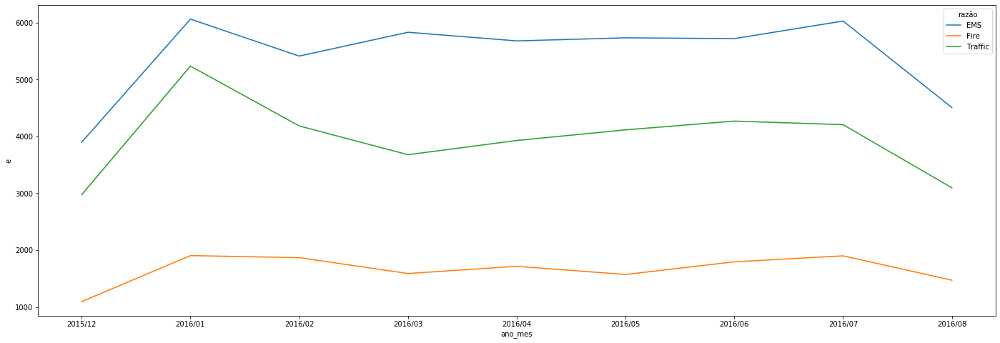

In [23]:
plt.figure(figsize=(24,8))
sns.lineplot(data=df,x='ano_mes',y='e',estimator='sum',hue='razão')

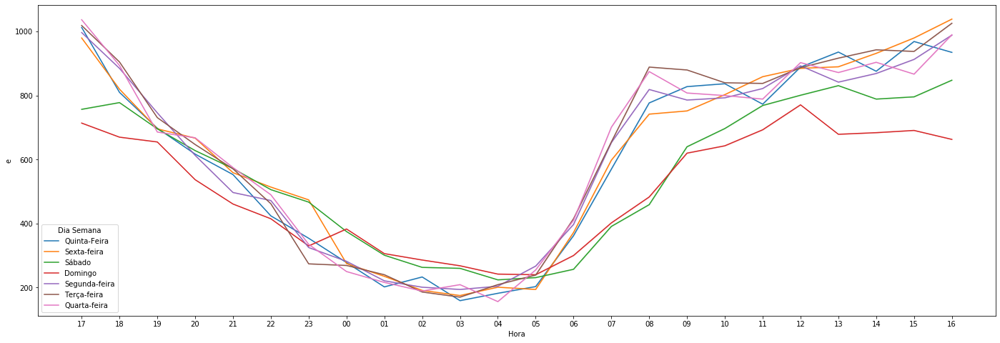

In [24]:
plt.figure(figsize=(24,8))
sns.lineplot(data=df,x='Hora',y='e',estimator='sum',hue='Dia Semana')

In [25]:
import plotly.express as px
import plotly.io as pio
pio.templates.default='plotly_dark'

In [26]:
df_agrupado=df.groupby(['Hora','Dia Semana']).agg({'e':np.count_nonzero})

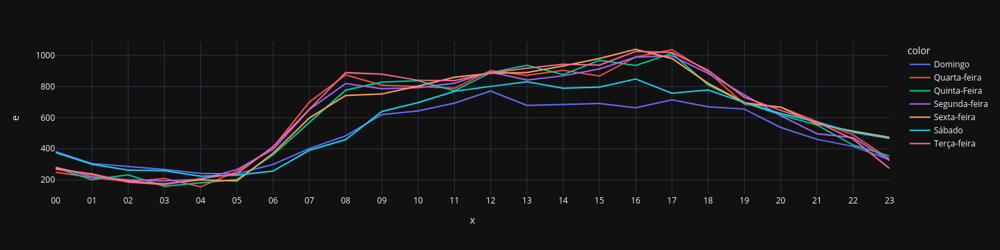

In [27]:
### plt.figure(figsize=(24,8))
px.line(data_frame=df_agrupado,x=df_agrupado.index.get_level_values('Hora'),y='e',color=df_agrupado.index.get_level_values('Dia Semana'))

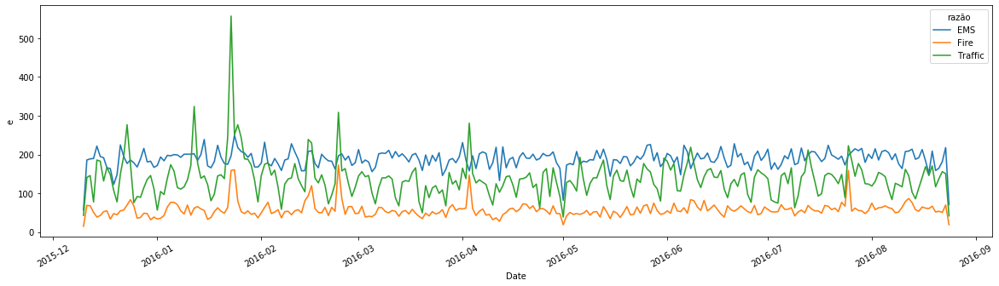

In [28]:
plt.figure(figsize=(20,5))
sns.lineplot(data=df,x='Date', y='e', estimator=np.count_nonzero,hue='razão')
plt.xticks(rotation=30)
plt.show()

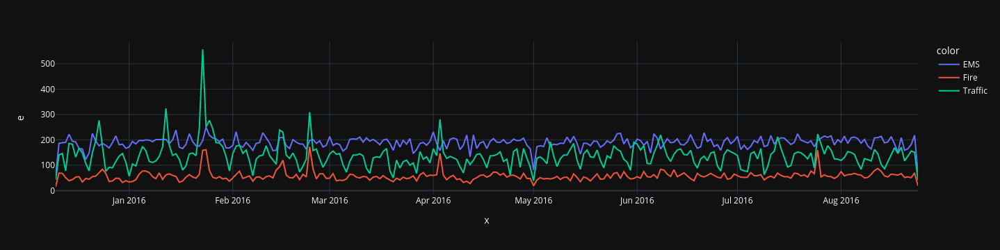

In [29]:
df_agrupado2=df.groupby(['Date','razão']).agg({'e':np.count_nonzero})
### plt.figure(figsize=(24,8))
px.line(data_frame=df_agrupado2,x=df_agrupado2.index.get_level_values('Date'),y='e',color=df_agrupado2.index.get_level_values('razão'))

In [30]:
df_agrupado2.head()

e
Date       razão       
2015-12-10 EMS       57
           Fire      15
           Traffic   43
2015-12-11 EMS      186
           Fire      69

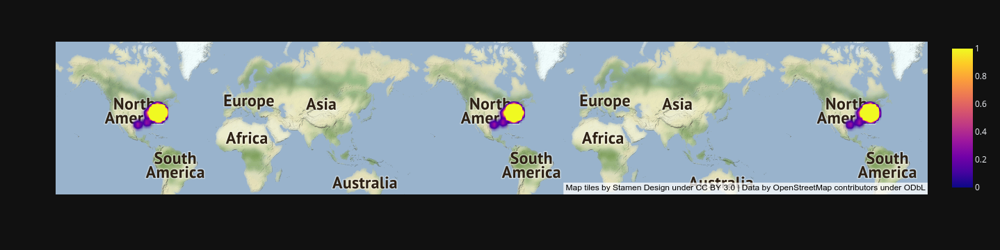

In [31]:
fig = px.density_mapbox(df, lat='lat', lon='lng', radius=10,
center=dict(lat=36, lon=-98), zoom=0,
mapbox_style="stamen-terrain")
fig.show() 

In [32]:
import plotly.graph_objects as go

In [34]:
df2 = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')
df2.head()
df2['name'] + '<br>Population ' + (df2['pop']/1e6).astype(str)+' million'

0               New York <br>Population 8.287238 million
1            Los Angeles <br>Population 3.826423 million
2                Chicago <br>Population 2.705627 million
3                Houston <br>Population 2.129784 million
4           Philadelphia <br>Population 1.539313 million
                              ...                       
3223        Spanish Fort <br>Population 0.007102 million
3224          Plaquemine <br>Population 0.007102 million
3225    Milton-Freewater <br>Population 0.007102 million
3226              Benton <br>Population 0.007096 million
3227          Ocean City <br>Population 0.007094 million
Length: 3228, dtype: object

In [45]:


df_agrupado=df.groupby(['lat','lng','twp']).agg({'e':np.count_nonzero})
df_agrupado.reset_index(inplace=True)  
df_agrupado['text'] = df_agrupado['twp'] + '<br>911 - Calls '+ (df_agrupado['e']).astype(str)
np.sort(pd.unique(df_agrupado['e']))

array([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,   11,
         12,   13,   14,   15,   16,   17,   18,   19,   20,   21,   22,
         23,   24,   25,   26,   27,   28,   29,   30,   31,   32,   33,
         34,   35,   36,   37,   38,   39,   40,   41,   42,   43,   44,
         45,   46,   47,   48,   49,   50,   51,   52,   53,   54,   55,
         56,   57,   58,   59,   60,   61,   62,   63,   64,   65,   66,
         67,   69,   70,   71,   72,   73,   74,   75,   76,   77,   78,
         79,   80,   81,   83,   84,   85,   86,   87,   88,   89,   90,
         91,   92,   93,   94,   95,   97,  100,  101,  102,  103,  104,
        105,  106,  108,  109,  110,  111,  112,  113,  114,  118,  120,
        121,  122,  124,  126,  127,  128,  131,  132,  133,  134,  135,
        137,  138,  142,  143,  144,  146,  148,  149,  150,  153,  158,
        159,  160,  164,  165,  166,  172,  176,  178,  179,  183,  199,
        201,  204,  205,  210,  219,  223,  225,  2

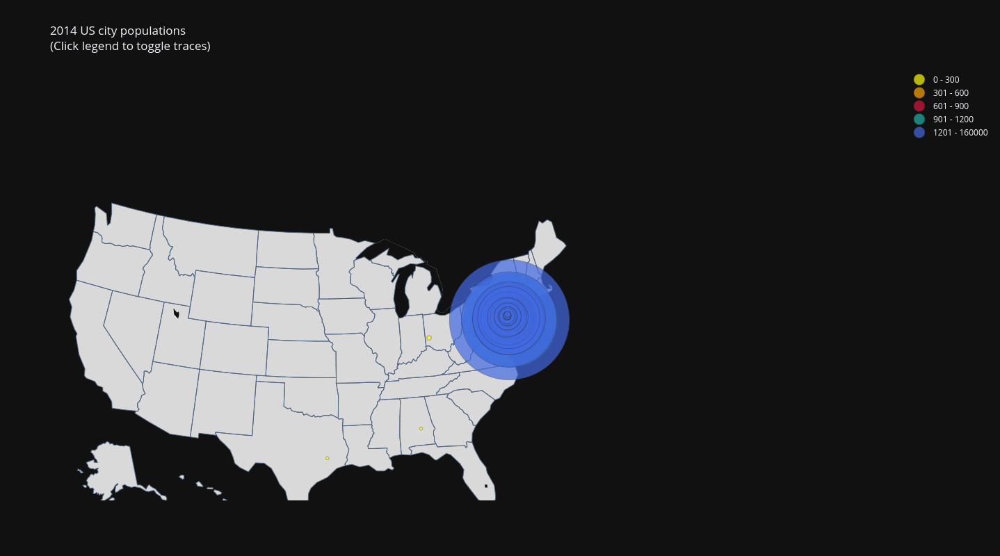

In [60]:


df_agrupado=df.groupby(['lat','lng','twp']).agg({'e':np.count_nonzero})
df_agrupado.reset_index(inplace=True)  
df_agrupado['text'] = df_agrupado['twp'] + '<br>911 - Calls '+ (df_agrupado['e']).astype(str)
limits = [(0,300),(301,600),(601,900),(901,1200),(1201,160000)]
colors = ["yellow","orange","crimson","lightseagreen","royalblue"]
cities = []
scale = 10

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    df_sub = df_agrupado[lim[0]:lim[1]]
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = df_sub['lng'],
        lat = df_sub['lat'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['e']*scale,
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])))

fig.update_layout(
        title_text = '2014 US city populations<br>(Click legend to toggle traces)',
        showlegend = True,
        width=1500,
        height=800,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)'
            
        )
    )

fig.show()


# Case 2: Titanic
---

Realize uma análise de dados sobre o dataset do Titanic. Para isso, como sugestão, você pode:

1. Aplicar um tratamento nos dados ausentes.
2. Analisar as métricas da estatística descritiva.
3. Realizar uma análise gráfica dos dados.
4. Extrair insigths a partir da análise das estatísticas de mortes/sobrevivência.

> [Clique aqui](https://s3-sa-east-1.amazonaws.com/lcpi/5729687e-ae14-4978-8cd7-7ef18277813d.csv) para fazer o download do dataset.

### O que quer dizer cada coluna
- PassengerId: Número de identificação do passageiro;
- Survived: Indica se o passageiro sobreviveu ao desastre. É atribuído o valor de 0 para aqueles que não sobreviveram, e 1 para quem sobreviveu;
- Pclass: Classe na qual o passageiro viajou. É informado 1 para primeira classe; 2 para segunda; e 3 para terceira;
- Name: Nome do passageiro;
- Sex: Sexo do passageiro;
- Age: Idade do passageiro em anos;
- SibSp: Quantidade de irmãos e cônjuges a bordo ;
- Parch: Quantidade de pais e filhos a bordo;
- Ticket: Número da passagem;
- Fare: Preço da passagem;
- Cabin: Número da cabine do passageiro;
- Embarked: Indica o porto no qual o passageiro embarcou. Há apenas três valores possíveis: Cherbourg, Queenstown e Southampton, indicados pelas letras “C”, “Q” e “S”, respectivamente.


In [76]:
#importa o dataframe
titanic=pd.read_csv('../Datasets/titanic_train.csv')

In [77]:
#checa quantas linhas e colunas temos
titanic.shape

(891, 12)

In [78]:
#checa quantos valores nulos temos na tabela
titanic.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [79]:
687/891

0.7710437710437711

In [80]:
# Chequei quais os valores que tinhamos na coluna Cabin, pois ela tinha muitos valores nulos (77%)
titanic['Cabin'].unique()

array([nan, 'C85', 'C123', 'E46', 'G6', 'C103', 'D56', 'A6',
       'C23 C25 C27', 'B78', 'D33', 'B30', 'C52', 'B28', 'C83', 'F33',
       'F G73', 'E31', 'A5', 'D10 D12', 'D26', 'C110', 'B58 B60', 'E101',
       'F E69', 'D47', 'B86', 'F2', 'C2', 'E33', 'B19', 'A7', 'C49', 'F4',
       'A32', 'B4', 'B80', 'A31', 'D36', 'D15', 'C93', 'C78', 'D35',
       'C87', 'B77', 'E67', 'B94', 'C125', 'C99', 'C118', 'D7', 'A19',
       'B49', 'D', 'C22 C26', 'C106', 'C65', 'E36', 'C54',
       'B57 B59 B63 B66', 'C7', 'E34', 'C32', 'B18', 'C124', 'C91', 'E40',
       'T', 'C128', 'D37', 'B35', 'E50', 'C82', 'B96 B98', 'E10', 'E44',
       'A34', 'C104', 'C111', 'C92', 'E38', 'D21', 'E12', 'E63', 'A14',
       'B37', 'C30', 'D20', 'B79', 'E25', 'D46', 'B73', 'C95', 'B38',
       'B39', 'B22', 'C86', 'C70', 'A16', 'C101', 'C68', 'A10', 'E68',
       'B41', 'A20', 'D19', 'D50', 'D9', 'A23', 'B50', 'A26', 'D48',
       'E58', 'C126', 'B71', 'B51 B53 B55', 'D49', 'B5', 'B20', 'F G63',
       'C62 C64',

In [81]:
# No meu entendimento, essa coluna não é tão importante para a análise dos dados, por isso exclui
titanic.drop('Cabin', axis=1, inplace=True)

In [82]:
titanic.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Embarked         2
dtype: int64

In [83]:
titanic['Embarked'].unique()
# dadas as opções vou modificar os valores nulos do Embarked por C
titanic['Embarked'] = titanic['Embarked'].fillna('C')
titanic['Embarked'].unique()

array(['S', 'C', 'Q'], dtype=object)

In [84]:
# tratantos as idades faltantes, trocando pela mediana
titanic['Age'].median()
titanic['Age'] = titanic['Age'].fillna(titanic['Age'].median())
titanic.isnull().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Embarked       0
dtype: int64

In [85]:
# também irei descartar as colunas nome e  pois acredito que elas não irão incluenciar nas análises
titanic.drop('Ticket', axis=1, inplace=True)
titanic.drop('Name', axis=1, inplace=True)

In [86]:
titanic.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.361582,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,13.019697,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,22.000000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,35.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [87]:
titanic.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,1,0,3,male,22.0,1,0,7.2500,S
1,2,1,1,female,38.0,1,0,71.2833,C
2,3,1,3,female,26.0,0,0,7.9250,S
3,4,1,1,female,35.0,1,0,53.1000,S
4,5,0,3,male,35.0,0,0,8.0500,S


In [88]:
titanic['Age'].unique()

array([22.  , 38.  , 26.  , 35.  , 28.  , 54.  ,  2.  , 27.  , 14.  ,
        4.  , 58.  , 20.  , 39.  , 55.  , 31.  , 34.  , 15.  ,  8.  ,
       19.  , 40.  , 66.  , 42.  , 21.  , 18.  ,  3.  ,  7.  , 49.  ,
       29.  , 65.  , 28.5 ,  5.  , 11.  , 45.  , 17.  , 32.  , 16.  ,
       25.  ,  0.83, 30.  , 33.  , 23.  , 24.  , 46.  , 59.  , 71.  ,
       37.  , 47.  , 14.5 , 70.5 , 32.5 , 12.  ,  9.  , 36.5 , 51.  ,
       55.5 , 40.5 , 44.  ,  1.  , 61.  , 56.  , 50.  , 36.  , 45.5 ,
       20.5 , 62.  , 41.  , 52.  , 63.  , 23.5 ,  0.92, 43.  , 60.  ,
       10.  , 64.  , 13.  , 48.  ,  0.75, 53.  , 57.  , 80.  , 70.  ,
       24.5 ,  6.  ,  0.67, 30.5 ,  0.42, 34.5 , 74.  ])

#### Análises gráficas
irei comparar as colunas: sexo, idade, pclass,  

In [89]:
df2=titanic.drop(['PassengerId','SibSp','Parch','Fare','Embarked'], axis=1)

In [90]:
df2['Sex'] = df2['Sex'].map({'male':0,
                             'female':1,
},
                             na_action=None)

In [91]:
df2.head()

,Survived,Pclass,Sex,Age
0,0,3,0,22.0
1,1,1,1,38.0
2,1,3,1,26.0
3,1,1,1,35.0
4,0,3,0,35.0


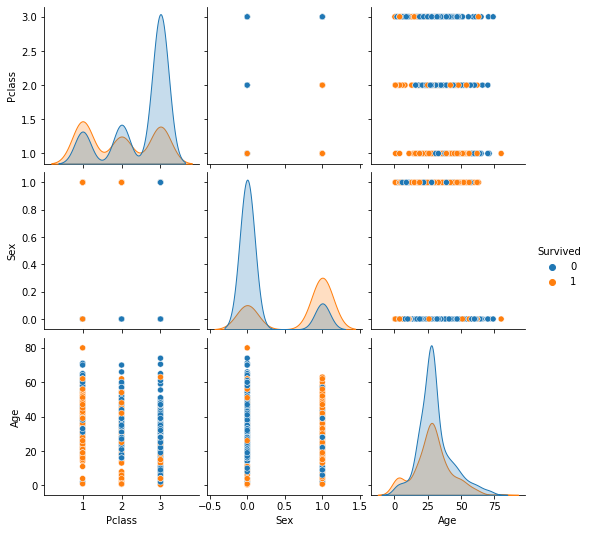

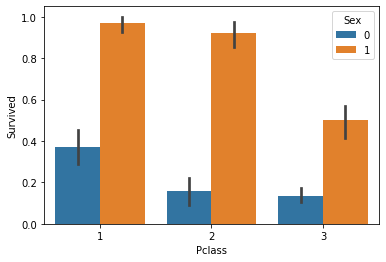

In [93]:
sns.barplot(data=df2,x='Pclass',y='Survived',hue='Sex')

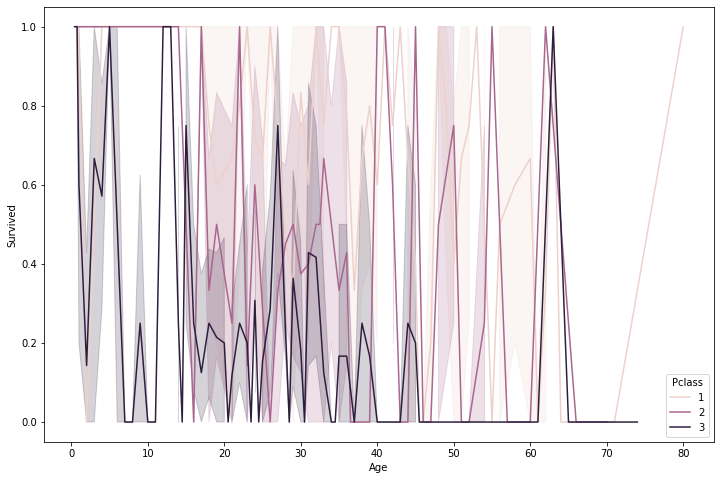

In [94]:
plt.figure(figsize=(12,8))
sns.lineplot(data=df2,x='Age',y='Survived',hue='Pclass')

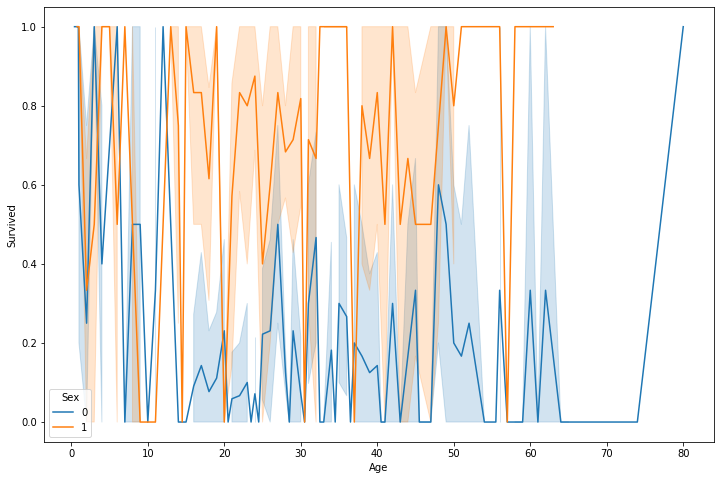

In [95]:
plt.figure(figsize=(12,8))
sns.lineplot(data=df2,x='Age',y='Survived',hue='Sex')

Pelas variáveis que eu optei por analisar, podemos perceber que se considerarmos as classes, pessoas da 1ª classe sobreviveram mais do que as outras, além disso mulheres sobreviveram mais que homens. Crianças também foram evacuadas e tiveram mais chances de sobreivência.